# Visualize county-level data via plotly

In [1]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import pandas as pd

In [2]:
county_info = pd.read_csv("../../data/02_county_FIPS.csv", index_col=0, dtype={'FIPS':str})

In [3]:
county_info.head()

,FIPS,county name,state
1,01001,Autauga,AL
2,01003,Baldwin,AL
3,01005,Barbour,AL
4,01007,Bibb,AL
5,01009,Blount,AL


In [8]:
df = pd.read_csv("../../data/nytimes/confirmed_cases.csv",
                   dtype={"countyFIPS": str})
df_full = county_info.join(df.set_index("countyFIPS"), on='FIPS', rsuffix='nytimes')

In [9]:
# preprocess fill na with zeros
df_full = df_full.fillna(0)

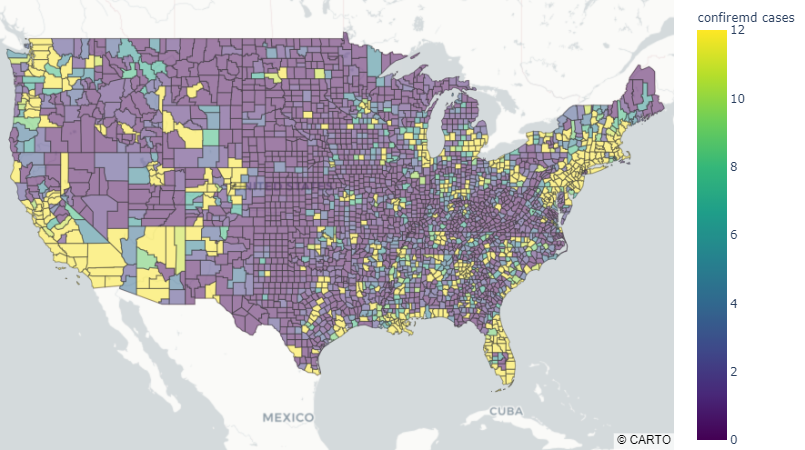

In [14]:
import plotly.express as px

curr_date = '03-27-2020'
fig = px.choropleth_mapbox(df_full, geojson=counties, locations='FIPS', color=curr_date,
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.5,
                           hover_data=['FIPS', 'county name', 'state', curr_date],
                           labels={curr_date:'confiremd cases',
                                   'state':'State',
                                   'county name': 'county name'}
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()